In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
import numpy as np # for linear algebra
import pandas as pd # for data processing, CSV file i/o
import matplotlib.pyplot as plt #for generating quick visuals
%matplotlib inline 
import seaborn as sns #used to visualize random distributions
from scipy.stats import skew, kurtosis #to represent distribution
from scipy.stats import norm # used to analyze the normal distribution and calculate its different distribution function values
plt.style.use('fivethirtyeight') #customizing the plot style

loading the data and get insights into the data EDA

In [3]:
house_train_df = pd.read_csv(r"C:\Users\USER\Desktop\ML\house_train.csv")
house_test_df = pd.read_csv(r"C:\Users\USER\Desktop\ML\house_test.csv")

In [4]:
house_train_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [5]:
house_test_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


Test df is lacking one column which is Sales Price to be Predicted

Summary statistics for the train dataset

In [6]:
house_train_df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


The house Prices ranges between $755000 max  and  $34900 min with average Price of $180921.195890

Merge the train and test dataset

In [7]:
total_df=house_train_df.append(house_test_df)
total_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500.0
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500.0
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500.0
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000.0
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000.0


In [8]:
total_df.nunique()

Id               2919
MSSubClass         16
MSZoning            5
LotFrontage       128
LotArea          1951
                 ... 
MoSold             12
YrSold              5
SaleType            9
SaleCondition       6
SalePrice         663
Length: 81, dtype: int64

Total Number of Rows and Columns in the dataset

In [9]:
total_df.shape

(2919, 81)

To understand the data types 

In [10]:
total_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2919 entries, 0 to 1458
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             2919 non-null   int64  
 1   MSSubClass     2919 non-null   int64  
 2   MSZoning       2915 non-null   object 
 3   LotFrontage    2433 non-null   float64
 4   LotArea        2919 non-null   int64  
 5   Street         2919 non-null   object 
 6   Alley          198 non-null    object 
 7   LotShape       2919 non-null   object 
 8   LandContour    2919 non-null   object 
 9   Utilities      2917 non-null   object 
 10  LotConfig      2919 non-null   object 
 11  LandSlope      2919 non-null   object 
 12  Neighborhood   2919 non-null   object 
 13  Condition1     2919 non-null   object 
 14  Condition2     2919 non-null   object 
 15  BldgType       2919 non-null   object 
 16  HouseStyle     2919 non-null   object 
 17  OverallQual    2919 non-null   int64  
 18  OverallC

descriptive statistics of the merged dataset

In [11]:
total_df.describe().T 

,count,mean,std,min,25%,50%,75%,max
Id,2919.0,1460.000000,842.787043,1.0,730.5,1460.0,2189.5,2919.0
MSSubClass,2919.0,57.137718,42.517628,20.0,20.0,50.0,70.0,190.0
LotFrontage,2433.0,69.305795,23.344905,21.0,59.0,68.0,80.0,313.0
LotArea,2919.0,10168.114080,7886.996359,1300.0,7478.0,9453.0,11570.0,215245.0
OverallQual,2919.0,6.089072,1.409947,1.0,5.0,6.0,7.0,10.0
OverallCond,2919.0,5.564577,1.113131,1.0,5.0,5.0,6.0,9.0
YearBuilt,2919.0,1971.312778,30.291442,1872.0,1953.5,1973.0,2001.0,2010.0
YearRemodAdd,2919.0,1984.264474,20.894344,1950.0,1965.0,1993.0,2004.0,2010.0
MasVnrArea,2896.0,102.201312,179.334253,0.0,0.0,0.0,164.0,1600.0
BsmtFinSF1,2918.0,441.423235,455.610826,0.0,0.0,368.5,733.0,5644.0


The house Prices ranges between  755000𝑚𝑎𝑥𝑎𝑛𝑑 34900 min with average Price of $180921.195890
which is the same as the train dataset

Correlation between all the features

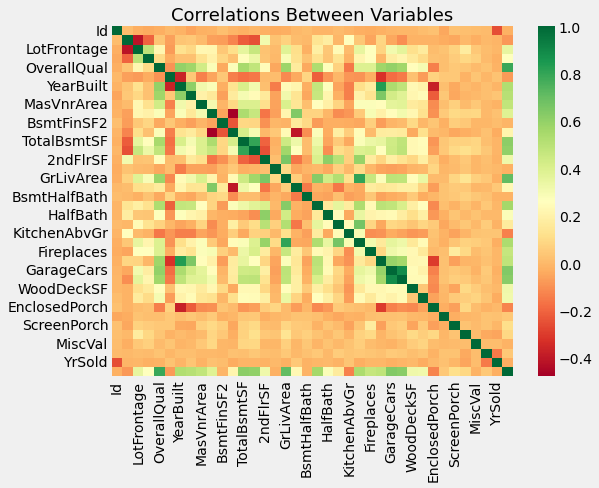

In [12]:
plt.figure(figsize=(8,6)) #correlations between the features
sns.heatmap(total_df.corr(), cmap="RdYlGn")
plt.title("Correlations Between Variables", size=18)
plt.show()

In [13]:
important_features = list(total_df.corr()["SalePrice"][(total_df.corr()["SalePrice"]>0.50) | (total_df.corr()["SalePrice"]<-0.50)].index)

In [14]:
print(important_features)

['OverallQual', 'YearBuilt', 'YearRemodAdd', 'TotalBsmtSF', '1stFlrSF', 'GrLivArea', 'FullBath', 'TotRmsAbvGrd', 'GarageCars', 'GarageArea', 'SalePrice']


further investigations into the most important features based on correlations

array([[<AxesSubplot:xlabel='OverallQual', ylabel='OverallQual'>,
        <AxesSubplot:xlabel='YearBuilt', ylabel='OverallQual'>,
        <AxesSubplot:xlabel='YearRemodAdd', ylabel='OverallQual'>,
        <AxesSubplot:xlabel='TotalBsmtSF', ylabel='OverallQual'>,
        <AxesSubplot:xlabel='1stFlrSF', ylabel='OverallQual'>,
        <AxesSubplot:xlabel='GrLivArea', ylabel='OverallQual'>,
        <AxesSubplot:xlabel='FullBath', ylabel='OverallQual'>,
        <AxesSubplot:xlabel='TotRmsAbvGrd', ylabel='OverallQual'>,
        <AxesSubplot:xlabel='GarageCars', ylabel='OverallQual'>,
        <AxesSubplot:xlabel='GarageArea', ylabel='OverallQual'>,
        <AxesSubplot:xlabel='SalePrice', ylabel='OverallQual'>],
       [<AxesSubplot:xlabel='OverallQual', ylabel='YearBuilt'>,
        <AxesSubplot:xlabel='YearBuilt', ylabel='YearBuilt'>,
        <AxesSubplot:xlabel='YearRemodAdd', ylabel='YearBuilt'>,
        <AxesSubplot:xlabel='TotalBsmtSF', ylabel='YearBuilt'>,
        <AxesSubplot:xlabel='1

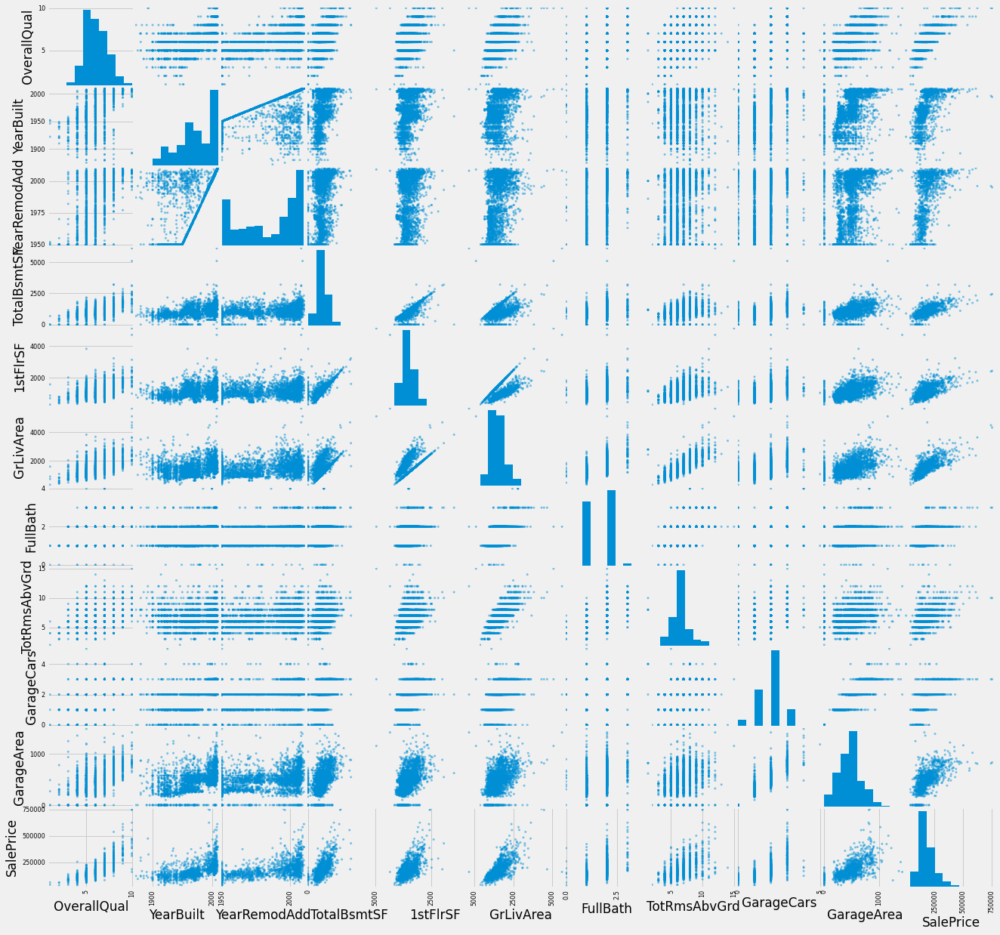

In [15]:
from pandas.plotting import scatter_matrix 
features_df = ['OverallQual','YearBuilt','YearRemodAdd','TotalBsmtSF','1stFlrSF','GrLivArea','FullBath','TotRmsAbvGrd','GarageCars','GarageArea','SalePrice']
scatter_matrix(total_df[features_df], figsize=(20,20))

In [16]:
plt.figure(figsize=(20,5), dpi=1000)

<Figure size 20000x5000 with 0 Axes>

<Figure size 20000x5000 with 0 Axes>

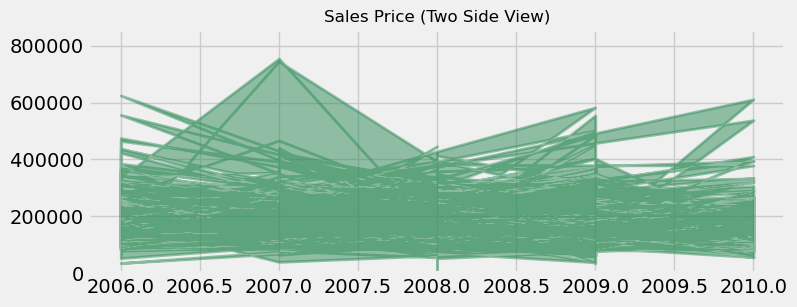

In [17]:
x = total_df['YrSold'].values #effect of year sold on price
y = total_df['SalePrice'].values
fig, ax = plt.subplots(1, 1, figsize=(8,3), dpi= 100)
plt.fill_between(x, y, alpha=0.5, linewidth=2, color='seagreen')
plt.ylim(-200, 855000)
plt.title('Sales Price (Two Side View)', fontsize=12)
plt.show()

<AxesSubplot:>

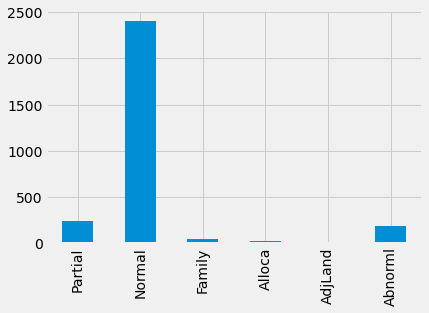

In [18]:
total_df['SaleCondition'].value_counts().sort_index(ascending=False).plot(kind='bar')#does sales condition have any effect?

sales under Normal condtion gives best price

In [19]:
# let's also consider some categorical features having high correlations

In [20]:
categorical_features= ["LandSlope","SaleCondition", "Utilities","MSZoning","BldgType","Heating","KitchenQual"]

In [21]:
main_dataset = important_features + categorical_features

In [22]:
print(main_dataset)

['OverallQual', 'YearBuilt', 'YearRemodAdd', 'TotalBsmtSF', '1stFlrSF', 'GrLivArea', 'FullBath', 'TotRmsAbvGrd', 'GarageCars', 'GarageArea', 'SalePrice', 'LandSlope', 'SaleCondition', 'Utilities', 'MSZoning', 'BldgType', 'Heating', 'KitchenQual']


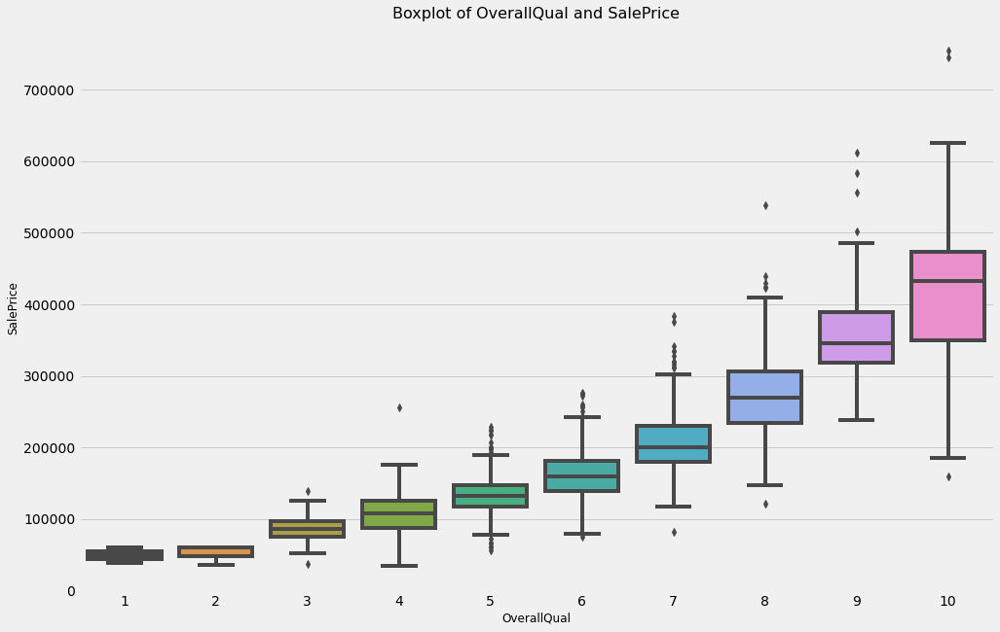

In [23]:
def plot_boxplot(main_dataset, x, y):
    plt.subplots(figsize=(15,10))
    ax = sns.boxplot(data=main_dataset, x=x, y=y)
    ax.set_ylabel(y, fontsize = 12)
    ax.set_xlabel(x, fontsize = 12)
    ax.set_title('Boxplot of ' + x + " and " + y, fontsize = 16)
    
plot_boxplot(total_df, x="OverallQual", y="SalePrice")

Increase in Quality also increases Sales Price

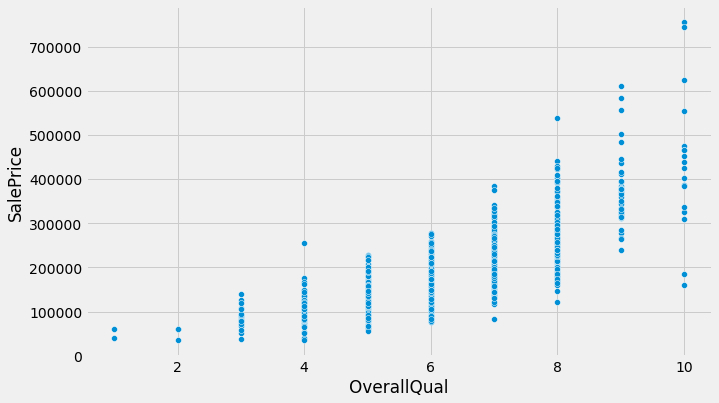

In [24]:
f, ax = plt.subplots(figsize=(10, 6))
sns.scatterplot(x=total_df["OverallQual"], y=total_df["SalePrice"],cmap="mako")
plt.show()

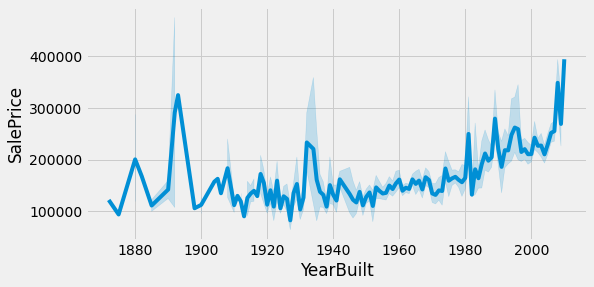

In [25]:
f, ax = plt.subplots(figsize=(8, 4))
sns.lineplot(x=house_train_df["YearBuilt"], y=house_train_df["SalePrice"])
plt.show()

price rises with years, meanwhile 1990 experienced a significant hike in price

<AxesSubplot:xlabel='SalePrice', ylabel='Density'>

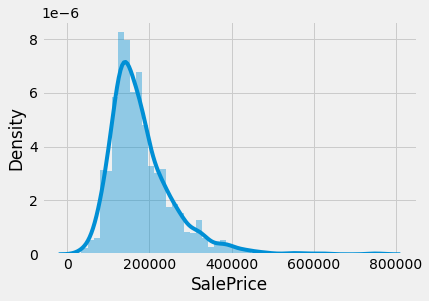

In [26]:
#let's check the price distribution
sns.distplot(total_df['SalePrice'])

Sales Price doesnot give a normal or gaussian distribution

<AxesSubplot:>

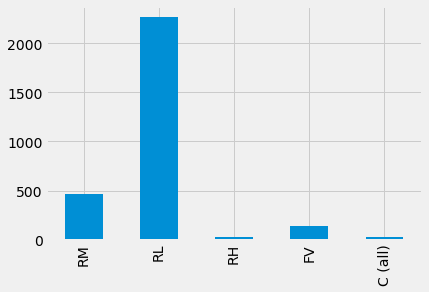

In [27]:
total_df['MSZoning'].value_counts().sort_index(ascending=False).plot(kind='bar')

MSZoning is mostly imparted by Room length. Room height, Front view and Corridors doesnot have significant impact

Modelling we first chose main_dataset = important_features + categorical_features

In [28]:
main_dataset=total_df[['OverallQual','YearBuilt','YearRemodAdd','TotalBsmtSF','1stFlrSF','GrLivArea', 'FullBath', 'TotRmsAbvGrd', 'GarageCars', 'GarageArea', 'SalePrice', 'LandSlope', 'SaleCondition', 'Utilities', 'MSZoning', 'BldgType', 'Heating', 'KitchenQual']]

In [29]:
main_dataset.head() #display it

,OverallQual,YearBuilt,YearRemodAdd,TotalBsmtSF,1stFlrSF,GrLivArea,FullBath,TotRmsAbvGrd,GarageCars,GarageArea,SalePrice,LandSlope,SaleCondition,Utilities,MSZoning,BldgType,Heating,KitchenQual
0,7,2003,2003,856.0,856,1710,2,8,2.0,548.0,208500.0,Gtl,Normal,AllPub,RL,1Fam,GasA,Gd
1,6,1976,1976,1262.0,1262,1262,2,6,2.0,460.0,181500.0,Gtl,Normal,AllPub,RL,1Fam,GasA,TA
2,7,2001,2002,920.0,920,1786,2,6,2.0,608.0,223500.0,Gtl,Normal,AllPub,RL,1Fam,GasA,Gd
3,7,1915,1970,756.0,961,1717,1,7,3.0,642.0,140000.0,Gtl,Abnorml,AllPub,RL,1Fam,GasA,Gd
4,8,2000,2000,1145.0,1145,2198,2,9,3.0,836.0,250000.0,Gtl,Normal,AllPub,RL,1Fam,GasA,Gd


Deal with missing values

In [30]:
main_dataset.isnull().sum() 

OverallQual         0
YearBuilt           0
YearRemodAdd        0
TotalBsmtSF         1
1stFlrSF            0
GrLivArea           0
FullBath            0
TotRmsAbvGrd        0
GarageCars          1
GarageArea          1
SalePrice        1459
LandSlope           0
SaleCondition       0
Utilities           2
MSZoning            4
BldgType            0
Heating             0
KitchenQual         1
dtype: int64

In [31]:
#no value is missing

In [32]:
#let's see the summary/descriptive statistics again
main_dataset.describe().T 

,count,mean,std,min,25%,50%,75%,max
OverallQual,2919.0,6.089072,1.409947,1.0,5.0,6.0,7.0,10.0
YearBuilt,2919.0,1971.312778,30.291442,1872.0,1953.5,1973.0,2001.0,2010.0
YearRemodAdd,2919.0,1984.264474,20.894344,1950.0,1965.0,1993.0,2004.0,2010.0
TotalBsmtSF,2918.0,1051.777587,440.766258,0.0,793.0,989.5,1302.0,6110.0
1stFlrSF,2919.0,1159.581706,392.362079,334.0,876.0,1082.0,1387.5,5095.0
GrLivArea,2919.0,1500.759849,506.051045,334.0,1126.0,1444.0,1743.5,5642.0
FullBath,2919.0,1.568003,0.552969,0.0,1.0,2.0,2.0,4.0
TotRmsAbvGrd,2919.0,6.451524,1.569379,2.0,5.0,6.0,7.0,15.0
GarageCars,2918.0,1.766621,0.761624,0.0,1.0,2.0,2.0,5.0
GarageArea,2918.0,472.874572,215.394815,0.0,320.0,480.0,576.0,1488.0


creating the current year in order to get difference in years since sales differs for years
year plays a very important role in house price prediction

In [33]:
main_dataset['Current_Year'] = 2022 

number of years = current year - Outlet_Establishment_Year. this is an important feature for our prediction, 
sales changes with years from the dataset

In [34]:
main_dataset['Num_Years'] = main_dataset['Current_Year'] - main_dataset['YearBuilt'] 

we also need number of years after remodelling

In [35]:
main_dataset['Num_Years_rem'] = main_dataset['Current_Year'] - main_dataset['YearRemodAdd']

In [36]:
main_dataset.drop(['YearBuilt'], axis=1,inplace=True)

In [37]:
main_dataset.drop(['Current_Year'], axis=1,inplace=True)

In [38]:
main_dataset.drop(['YearRemodAdd'], axis=1,inplace=True)

In [39]:
main_dataset.head()

,OverallQual,TotalBsmtSF,1stFlrSF,GrLivArea,FullBath,TotRmsAbvGrd,GarageCars,GarageArea,SalePrice,LandSlope,SaleCondition,Utilities,MSZoning,BldgType,Heating,KitchenQual,Num_Years,Num_Years_rem
0,7,856.0,856,1710,2,8,2.0,548.0,208500.0,Gtl,Normal,AllPub,RL,1Fam,GasA,Gd,19,19
1,6,1262.0,1262,1262,2,6,2.0,460.0,181500.0,Gtl,Normal,AllPub,RL,1Fam,GasA,TA,46,46
2,7,920.0,920,1786,2,6,2.0,608.0,223500.0,Gtl,Normal,AllPub,RL,1Fam,GasA,Gd,21,20
3,7,756.0,961,1717,1,7,3.0,642.0,140000.0,Gtl,Abnorml,AllPub,RL,1Fam,GasA,Gd,107,52
4,8,1145.0,1145,2198,2,9,3.0,836.0,250000.0,Gtl,Normal,AllPub,RL,1Fam,GasA,Gd,22,22


In [40]:
main_dataset.isnull().sum()

OverallQual         0
TotalBsmtSF         1
1stFlrSF            0
GrLivArea           0
FullBath            0
TotRmsAbvGrd        0
GarageCars          1
GarageArea          1
SalePrice        1459
LandSlope           0
SaleCondition       0
Utilities           2
MSZoning            4
BldgType            0
Heating             0
KitchenQual         1
Num_Years           0
Num_Years_rem       0
dtype: int64

In [41]:
main_dataset['TotalBsmtSF'].mode()[0]

0.0

In [42]:
main_dataset['TotalBsmtSF']=main_dataset['TotalBsmtSF'].fillna(main_dataset['TotalBsmtSF'].mode()[0])
main_dataset['TotalBsmtSF'].isnull().sum()

0

In [43]:
main_dataset['GarageCars']=main_dataset['GarageCars'].fillna(main_dataset['GarageCars'].mode()[0])
main_dataset['GarageCars'].isnull().sum()

0

In [44]:
main_dataset['GarageArea']=main_dataset['GarageArea'].fillna(main_dataset['GarageArea'].mode()[0])
main_dataset['GarageArea'].isnull().sum()

0

In [45]:
main_dataset['Utilities']=main_dataset['Utilities'].fillna(main_dataset['Utilities'].mode()[0])
main_dataset['Utilities'].isnull().sum()

0

In [46]:
main_dataset['MSZoning']=main_dataset['MSZoning'].fillna(main_dataset['MSZoning'].mode()[0])
main_dataset['MSZoning'].isnull().sum()

0

In [47]:
main_dataset['KitchenQual']=main_dataset['KitchenQual'].fillna(main_dataset['KitchenQual'].mode()[0])
main_dataset['KitchenQual'].isnull().sum()

0

In [48]:
main_dataset.isnull().sum()

OverallQual         0
TotalBsmtSF         0
1stFlrSF            0
GrLivArea           0
FullBath            0
TotRmsAbvGrd        0
GarageCars          0
GarageArea          0
SalePrice        1459
LandSlope           0
SaleCondition       0
Utilities           0
MSZoning            0
BldgType            0
Heating             0
KitchenQual         0
Num_Years           0
Num_Years_rem       0
dtype: int64

In [49]:
#deal with categorical data 
from sklearn.preprocessing import OrdinalEncoder

ord_enc = OrdinalEncoder()
main_dataset["LandSlope"] = ord_enc.fit_transform(main_dataset[["LandSlope"]])
main_dataset['SaleCondition'] =ord_enc.fit_transform(main_dataset[["SaleCondition"]])
main_dataset['Utilities'] =ord_enc.fit_transform(main_dataset[["Utilities"]])
main_dataset['MSZoning'] =ord_enc.fit_transform(main_dataset[["MSZoning"]])
main_dataset['BldgType'] =ord_enc.fit_transform(main_dataset[["BldgType"]])
main_dataset['Heating'] =ord_enc.fit_transform(main_dataset[["Heating"]])
main_dataset['KitchenQual'] =ord_enc.fit_transform(main_dataset[["KitchenQual"]])

In [50]:
main_dataset.head()

,OverallQual,TotalBsmtSF,1stFlrSF,GrLivArea,FullBath,TotRmsAbvGrd,GarageCars,GarageArea,SalePrice,LandSlope,SaleCondition,Utilities,MSZoning,BldgType,Heating,KitchenQual,Num_Years,Num_Years_rem
0,7,856.0,856,1710,2,8,2.0,548.0,208500.0,0.0,4.0,0.0,3.0,0.0,1.0,2.0,19,19
1,6,1262.0,1262,1262,2,6,2.0,460.0,181500.0,0.0,4.0,0.0,3.0,0.0,1.0,3.0,46,46
2,7,920.0,920,1786,2,6,2.0,608.0,223500.0,0.0,4.0,0.0,3.0,0.0,1.0,2.0,21,20
3,7,756.0,961,1717,1,7,3.0,642.0,140000.0,0.0,0.0,0.0,3.0,0.0,1.0,2.0,107,52
4,8,1145.0,1145,2198,2,9,3.0,836.0,250000.0,0.0,4.0,0.0,3.0,0.0,1.0,2.0,22,22


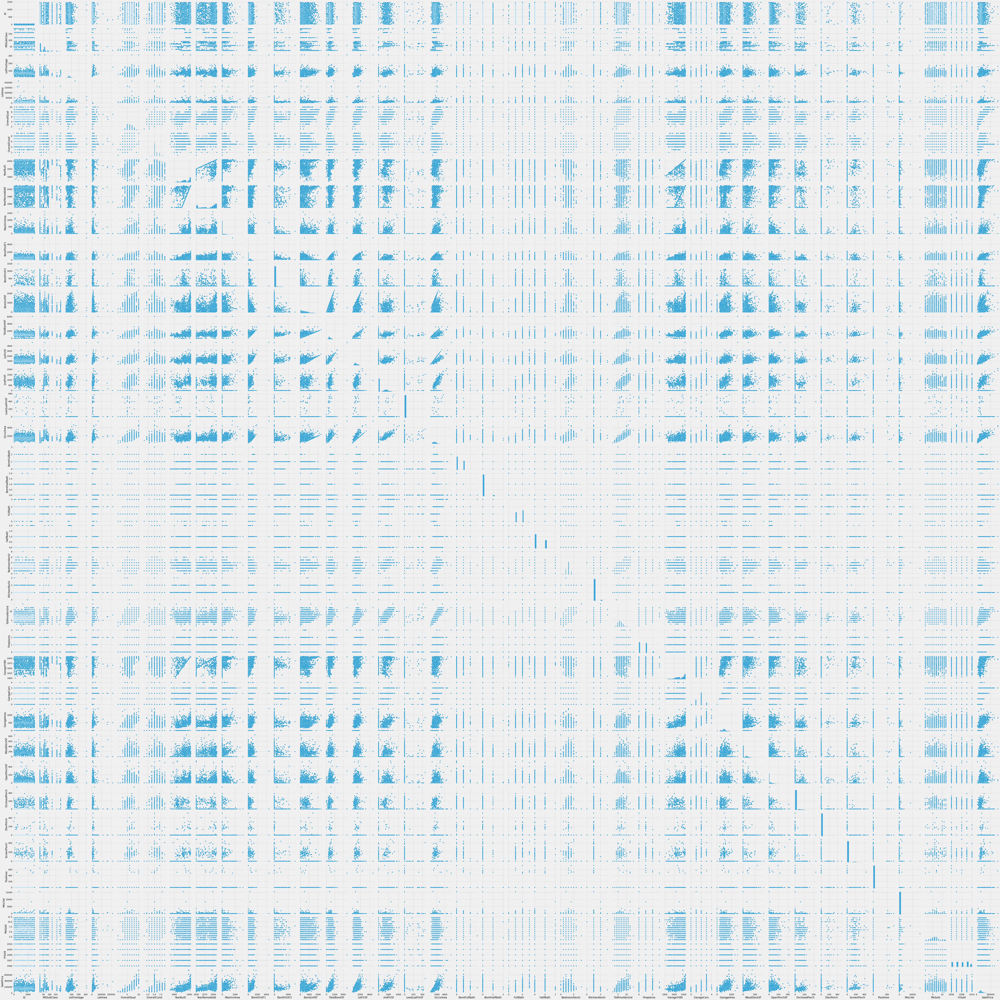

In [51]:
sns.pairplot(data=house_train_df)

In [52]:
col_list = list(main_dataset)
col_list[0], col_list[8] = col_list[8], col_list[0]
main_dataset.columns = col_list
main_dataset

,SalePrice,TotalBsmtSF,1stFlrSF,GrLivArea,FullBath,TotRmsAbvGrd,GarageCars,GarageArea,OverallQual,LandSlope,SaleCondition,Utilities,MSZoning,BldgType,Heating,KitchenQual,Num_Years,Num_Years_rem
0,7,856.0,856,1710,2,8,2.0,548.0,208500.0,0.0,4.0,0.0,3.0,0.0,1.0,2.0,19,19
1,6,1262.0,1262,1262,2,6,2.0,460.0,181500.0,0.0,4.0,0.0,3.0,0.0,1.0,3.0,46,46
2,7,920.0,920,1786,2,6,2.0,608.0,223500.0,0.0,4.0,0.0,3.0,0.0,1.0,2.0,21,20
3,7,756.0,961,1717,1,7,3.0,642.0,140000.0,0.0,0.0,0.0,3.0,0.0,1.0,2.0,107,52
4,8,1145.0,1145,2198,2,9,3.0,836.0,250000.0,0.0,4.0,0.0,3.0,0.0,1.0,2.0,22,22
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,4,546.0,546,1092,1,5,0.0,0.0,NaN,0.0,4.0,0.0,4.0,3.0,1.0,3.0,52,52
1455,4,546.0,546,1092,1,6,1.0,286.0,NaN,0.0,0.0,0.0,4.0,4.0,1.0,3.0,52,52
1456,5,1224.0,1224,1224,1,7,2.0,576.0,NaN,0.0,0.0,0.0,3.0,0.0,1.0,3.0,62,26
1457,5,912.0,970,970,1,6,0.0,0.0,NaN,0.0,4.0,0.0,3.0,0.0,1.0,3.0,30,30


In [53]:
X = main_dataset.iloc[:,1:] # all the features in the dataset are independent variables except Sale price
y = main_dataset.iloc[:,0] #this selects the Selling price as the dependent variable

In [54]:
#view independent features
X.head()

,TotalBsmtSF,1stFlrSF,GrLivArea,FullBath,TotRmsAbvGrd,GarageCars,GarageArea,OverallQual,LandSlope,SaleCondition,Utilities,MSZoning,BldgType,Heating,KitchenQual,Num_Years,Num_Years_rem
0,856.0,856,1710,2,8,2.0,548.0,208500.0,0.0,4.0,0.0,3.0,0.0,1.0,2.0,19,19
1,1262.0,1262,1262,2,6,2.0,460.0,181500.0,0.0,4.0,0.0,3.0,0.0,1.0,3.0,46,46
2,920.0,920,1786,2,6,2.0,608.0,223500.0,0.0,4.0,0.0,3.0,0.0,1.0,2.0,21,20
3,756.0,961,1717,1,7,3.0,642.0,140000.0,0.0,0.0,0.0,3.0,0.0,1.0,2.0,107,52
4,1145.0,1145,2198,2,9,3.0,836.0,250000.0,0.0,4.0,0.0,3.0,0.0,1.0,2.0,22,22


In [55]:
#view my dependent feature
y.head()

0    7
1    6
2    7
3    7
4    8
Name: SalePrice, dtype: int64

In [56]:
house_test_df =main_dataset[main_dataset['SalePrice'].isnull()]

In [57]:
house_test_df.head()

,SalePrice,TotalBsmtSF,1stFlrSF,GrLivArea,FullBath,TotRmsAbvGrd,GarageCars,GarageArea,OverallQual,LandSlope,SaleCondition,Utilities,MSZoning,BldgType,Heating,KitchenQual,Num_Years,Num_Years_rem


In [58]:
house_train_df=main_dataset[~main_dataset['SalePrice'].isnull()]
house_train_df.head()

,SalePrice,TotalBsmtSF,1stFlrSF,GrLivArea,FullBath,TotRmsAbvGrd,GarageCars,GarageArea,OverallQual,LandSlope,SaleCondition,Utilities,MSZoning,BldgType,Heating,KitchenQual,Num_Years,Num_Years_rem
0,7,856.0,856,1710,2,8,2.0,548.0,208500.0,0.0,4.0,0.0,3.0,0.0,1.0,2.0,19,19
1,6,1262.0,1262,1262,2,6,2.0,460.0,181500.0,0.0,4.0,0.0,3.0,0.0,1.0,3.0,46,46
2,7,920.0,920,1786,2,6,2.0,608.0,223500.0,0.0,4.0,0.0,3.0,0.0,1.0,2.0,21,20
3,7,756.0,961,1717,1,7,3.0,642.0,140000.0,0.0,0.0,0.0,3.0,0.0,1.0,2.0,107,52
4,8,1145.0,1145,2198,2,9,3.0,836.0,250000.0,0.0,4.0,0.0,3.0,0.0,1.0,2.0,22,22


In [59]:
main_dataset.isnull().sum()

SalePrice           0
TotalBsmtSF         0
1stFlrSF            0
GrLivArea           0
FullBath            0
TotRmsAbvGrd        0
GarageCars          0
GarageArea          0
OverallQual      1459
LandSlope           0
SaleCondition       0
Utilities           0
MSZoning            0
BldgType            0
Heating             0
KitchenQual         0
Num_Years           0
Num_Years_rem       0
dtype: int64

In [60]:
main_dataset['OverallQual']=main_dataset['OverallQual'].fillna(main_dataset['OverallQual'].mode()[0])
main_dataset['OverallQual'].isnull().sum()

0

In [61]:
main_dataset.isnull().sum()

SalePrice        0
TotalBsmtSF      0
1stFlrSF         0
GrLivArea        0
FullBath         0
TotRmsAbvGrd     0
GarageCars       0
GarageArea       0
OverallQual      0
LandSlope        0
SaleCondition    0
Utilities        0
MSZoning         0
BldgType         0
Heating          0
KitchenQual      0
Num_Years        0
Num_Years_rem    0
dtype: int64

In [62]:
X=main_dataset.drop('SalePrice',axis=1)
X.head()

,TotalBsmtSF,1stFlrSF,GrLivArea,FullBath,TotRmsAbvGrd,GarageCars,GarageArea,OverallQual,LandSlope,SaleCondition,Utilities,MSZoning,BldgType,Heating,KitchenQual,Num_Years,Num_Years_rem
0,856.0,856,1710,2,8,2.0,548.0,208500.0,0.0,4.0,0.0,3.0,0.0,1.0,2.0,19,19
1,1262.0,1262,1262,2,6,2.0,460.0,181500.0,0.0,4.0,0.0,3.0,0.0,1.0,3.0,46,46
2,920.0,920,1786,2,6,2.0,608.0,223500.0,0.0,4.0,0.0,3.0,0.0,1.0,2.0,21,20
3,756.0,961,1717,1,7,3.0,642.0,140000.0,0.0,0.0,0.0,3.0,0.0,1.0,2.0,107,52
4,1145.0,1145,2198,2,9,3.0,836.0,250000.0,0.0,4.0,0.0,3.0,0.0,1.0,2.0,22,22


Dependent Variable

In [63]:
y=main_dataset['SalePrice']
y.head()

0    7
1    6
2    7
3    7
4    8
Name: SalePrice, dtype: int64

Training Models

Split the dataset 80% for training and 20% for testing

In [64]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [65]:
#model libraries
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from math import sqrt

In [66]:
#linear Regression
lr = LinearRegression()
lr.fit(X_train, y_train)

LinearRegression()

In [67]:
pred_train_lr= lr.predict(X_train)
print(np.sqrt(mean_squared_error(y_train,pred_train_lr)))
print(r2_score(y_train, pred_train_lr))

pred_test_lr= lr.predict(X_test)
print(np.sqrt(mean_squared_error(y_test,pred_test_lr))) 
print(r2_score(y_test, pred_test_lr))

0.8072155482391989
0.6701430404821649
0.8468751025929738
0.6472466129385286


In [68]:
 rr = Ridge(alpha=0.01)
rr.fit(X_train, y_train) 
pred_train_rr= rr.predict(X_train)
print(np.sqrt(mean_squared_error(y_train,pred_train_rr)))
print(r2_score(y_train, pred_train_rr))

pred_test_rr= rr.predict(X_test)
print(np.sqrt(mean_squared_error(y_test,pred_test_rr))) 
print(r2_score(y_test, pred_test_rr))

0.8072155482697686
0.6701430404571811
0.8468746432079622
0.6472469956385851


In [69]:
#lasso Regression
model_lasso = Lasso(alpha=0.01)
model_lasso.fit(X_train, y_train) 
pred_train_lasso= model_lasso.predict(X_train)
print(np.sqrt(mean_squared_error(y_train,pred_train_lasso)))
print(r2_score(y_train, pred_train_lasso))

pred_test_lasso= model_lasso.predict(X_test)
print(np.sqrt(mean_squared_error(y_test,pred_test_lasso))) 
print(r2_score(y_test, pred_test_lasso))

0.8106002907024709
0.6673709887721266
0.8466340637330149
0.6474473867567896


In [70]:
#ElasticNet
model_enet = ElasticNet()
model_enet.fit(X_train, y_train) 
pred_train_enet= model_enet.predict(X_train)
print(np.sqrt(mean_squared_error(y_train,pred_train_enet)))
print(r2_score(y_train, pred_train_enet))

pred_test_enet= model_enet.predict(X_test)
print(np.sqrt(mean_squared_error(y_test,pred_test_enet)))
print(r2_score(y_test, pred_test_enet))

0.8468601115928512
0.6369470505404862
0.8744548281255077
0.6238966324306281


In [71]:
#Support Vector Machines
svr = SVR(C=100000)
svr.fit(X_train, y_train)
pred_train_svr= svr.predict(X_train)
print(np.sqrt(mean_squared_error(y_train,pred_train_svr)))
print(r2_score(y_train, pred_train_svr))

pred_test_svr= svr.predict(X_test)
print(np.sqrt(mean_squared_error(y_test,pred_test_svr)))
print(r2_score(y_test, pred_test_svr))

0.8257047593839939
0.6548592883181046
0.8687110025985993
0.6288212488172774


In [72]:
#Randomforest
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor()
n_estimators = [int(x) for x in np.linspace(start=100,stop=1200,num=12)]
print(n_estimators)

[100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200]


In [73]:
#randomized search cv
n_estimators = [int(x) for x in np.linspace(start=100,stop=1200,num=12)]
#nos. of features to consider at every split
max_features = ['auto', 'sqrt']
#max nos. of levels in tree
max_depth = [int(x) for x in np.linspace(6,30,num=6)]
#min nos. of samples required to split a node
min_samples_split = [2,5,10,15,100]
#min nos. of required at each leaf node
min_samples_leaf = [1,2,5,10]

In [74]:
from sklearn.model_selection import RandomizedSearchCV
#create random grid to see the various parameters that has been taken
random_grid = {'n_estimators':n_estimators,
               'max_features':max_features,
              'max_depth':max_depth,
             'min_samples_split':min_samples_split,
              'min_samples_leaf':min_samples_leaf}
print(random_grid)

{'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200], 'max_features': ['auto', 'sqrt'], 'max_depth': [6, 10, 15, 20, 25, 30], 'min_samples_split': [2, 5, 10, 15, 100], 'min_samples_leaf': [1, 2, 5, 10]}


In [75]:
rf_random = RandomizedSearchCV(estimator=rf, param_distributions=random_grid,scoring='neg_mean_squared_error',n_iter=10,cv=5,verbose=2,random_state=42,n_jobs=1)

In [76]:
rf_random.fit(X_train,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=   5.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=   4.6s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=   4.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=   4.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=   4.6s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1100; total time=   5.9s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1100; total time=   5.8s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimator

RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=1,
                   param_distributions={'max_depth': [6, 10, 15, 20, 25, 30],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 5, 10],
                                        'min_samples_split': [2, 5, 10, 15,
                                                              100],
                                        'n_estimators': [100, 200, 300, 400,
                                                         500, 600, 700, 800,
                                                         900, 1000, 1100,
                                                         1200]},
                   random_state=42, scoring='neg_mean_squared_error',
                   verbose=2)

In [77]:
pred_train_rf= rf_random.predict(X_train)
print(np.sqrt(mean_squared_error(y_train,pred_train_rf)))
print(r2_score(y_train, pred_train_rf))

pred_test_rf= rf_random.predict(X_test)
print(np.sqrt(mean_squared_error(y_test,pred_test_rf)))
print(r2_score(y_test, pred_test_rf))

0.26284249846751656
0.9650266053985392
0.7330301031720738
0.7357128289397343


In [78]:
rlr = Ridge().fit(X_train, y_train)

In [79]:
pred_train_rlr= rlr.predict(X_train)
print(np.sqrt(mean_squared_error(y_train,pred_train_rlr)))
rmse=(np.sqrt(mean_squared_error(y_train,pred_train_rlr)))
print(r2_score(y_train, pred_train_rlr))
score = (r2_score(y_train, pred_train_rlr))
pred_test_rlr= rlr.predict(X_test)
print(np.sqrt(mean_squared_error(y_test,pred_test_rlr)))
rmse=(np.sqrt(mean_squared_error(y_test,pred_test_rlr)))
print(r2_score(y_test, pred_test_rlr))
score = (r2_score(y_train, pred_train_rlr))

0.8072158499012594
0.6701427939424422
0.846830013502246
0.647284174335744


In [80]:
from xgboost import XGBRegressor
xg = XGBRegressor(n_estimators=1000,max_depth=7,eta=0.1,subsample=0.7,colsample_bytree=0.8)
xg=xg.fit(X_train, y_train)

In [81]:
pred_train_xg= xg.predict(X_train)
print(np.sqrt(mean_squared_error(y_train,pred_train_xg)))
rmse=(np.sqrt(mean_squared_error(y_train,pred_train_xg)))
print(r2_score(y_train, pred_train_xg))
score = (r2_score(y_train, pred_train_xg))

pred_test_xg= xg.predict(X_test)
print(np.sqrt(mean_squared_error(y_test,pred_test_xg)))
rmse=(np.sqrt(mean_squared_error(y_test,pred_test_xg)))
print(r2_score(y_test, pred_test_xg))
score = (r2_score(y_train, pred_train_xg))

0.0055308675544659845
0.9999845142183311
0.7501041541781711
0.723257663432587


In [84]:
#comparison of model test scores
evaluated_models=['lr', 'rr', 'lasso', 'enet', 'svr', 'rf', 'rlr', 'xg']
evaluated_test_scores= [0.7210718341351787, 0.7210746321381586,0.7252155311789273,0.726709344637021,0.7549088638031151,0.7997270741330147,0.721330571648845,0.723257663432587]
evaluated_train_scores=[0.7033418732049195, 0.7033418465654369,0.700890499420815,0.6765223046710352,0.7549088638031151,0.9643221690465229,0.7032740951344892,0.723257663432587]

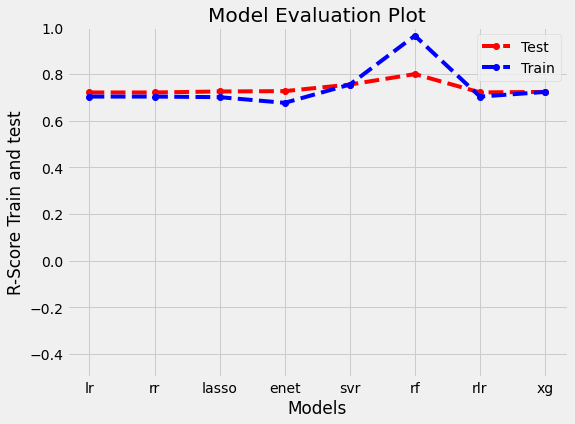

In [85]:
plt.figure(figsize=(8,6))
plt.plot(evaluated_models,evaluated_test_scores,marker="o",linestyle="--",color="r", label='Test')
plt.plot(evaluated_models,evaluated_train_scores,marker="o",linestyle="--",color="b", label='Train')
plt.ylim(-0.5,1)
plt.title("Model Evaluation Plot")
plt.xlabel("Models")
plt.ylabel("R-Score Train and test")
plt.legend()
plt.show()

In [90]:
#comparison of models test rmse
evaluated_models=['lr', 'rr', 'lasso', 'enet', 'svr', 'rf', 'rlr','xg']
evaluated_test_rmse= [0.7601886554944861, 0.7601848426571362,0.7545209272323931,0.7524672275949302,0.7139399990314239,0.6441489749249011,0.7501041541781711,0.7501041541781711]
evaluated_train_rmse= [0.7445730955151909, 0.7445731289459986,0.7476430802947812,0.7775017664374463,0.7311521849366787,0.25821319768585416,0.7446581477031783,0.9999845142183311]

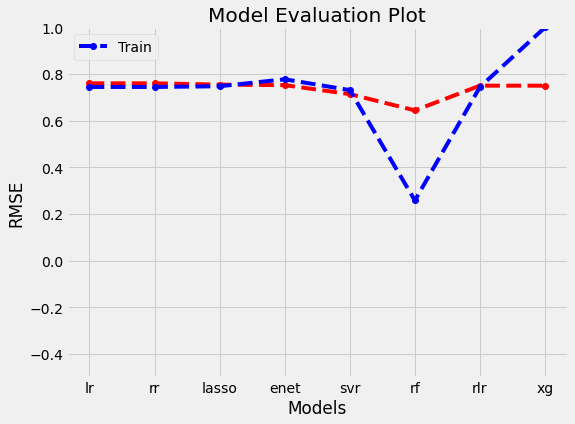

In [91]:
plt.figure(figsize=(8,6))
plt.plot(evaluated_models,evaluated_test_rmse,marker="o",linestyle="--",color="r")
plt.plot(evaluated_models,evaluated_train_rmse,marker="o",linestyle="--",color="b", label='Train')
plt.ylim(-0.5,1)
plt.title("Model Evaluation Plot")
plt.xlabel("Models")
plt.ylabel("RMSE")
plt.legend()
plt.show()